# **Домашнее задание. DiT + Flow-matching на MNIST'е**

# **Панасюк Михаил**

**Курс**: GenAI, Higher School of Economics

**Автор**: [Иван Вовк](https://scholar.google.com/citations?user=mRAPOFkAAAAJ&hl=ru), Principal Engineer, MTS AI

**Связь**: телеграм [@ivvovk](https://t.me/ivvovk)

В этом домашнем задании мы закрепим работу диффузий и научимся генерировать картинки!

Как будет оцениваться работа:

1. Правильно реализованы в DiT'е патчификация + multi-head self-attention + FFN + реализован forward pass - 4 балла
2. Правильно реализован подсчет flow-matching лосса - 3 балла
3. Правильно доработан метод Эйлера в семплинге - 2 балла
4. Модель обучена и умеет генерировать картинки по заданным лейблам - 1 балл

**Итого:** максимум 10 баллов

**Как сдавать:** нужно прислать заполненную тетрадку и обученный чекпоинт модели на почту ivovk@hse.ru и отметиться в [ГУГЛ ТАБЛИЧКЕ](https://docs.google.com/spreadsheets/d/1kZY28xmIXtcwpOs078MOTa7DztEedTRm9o7_CdJxswE/edit?usp=sharing), что домашка была отослана

**Дедлайн: 29 апреля (вторник), 23:59**

In [1]:
from __future__ import annotations

import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

import torch
import torchvision as tv

# вспомогательная функция для отрисовки картинок
def imshow(imgs: torch.FloatTensor['B C H W'], nrow: int | None = None) -> None:
    # matplotlib требует диапазон [-1, +1] -> [0, 1]
    imgs = (imgs.cpu() + 1.0) / 2.0  # [B, C, H, W]
    nrow = int(np.sqrt(imgs.shape[0])) if nrow is None else imgs.shape[0]//nrow
    grid = tv.utils.make_grid(imgs, nrow=nrow, normalize=False, padding=0)  # [C, Hnew, Wnew]
    plt.figure(figsize=(12, 6))
    plt.imshow(grid.permute(1,2,0))
    plt.axis('off')
    plt.show()

**Важно!** Советую сначала написать и отработать весь код на CPU и только в самом конце уже переходить на GPU (CUDA) для обучения, поскольку Google Colab хоть и бесплатен, но у него есть лимиты, а для написания кода и дебага GPU не нужны.

Если кто не работал с Google Colab, как подключить GPU:

1. В меню сверху выбираем Runtime (Среда выполнения)
2. Жмем Change runtime type (Сменить тип среды)
3. Ставим галочку напротив T4 GPU
4. Со всем соглашаемся, среда перезапустится с подключенной GPU
5. Выставляем во флаге DEVICE ниже `'cuda'`
6. Перекомпилируем заново все ячейки

In [2]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DTYPE = torch.float16  # будем обучаться в fp16 вместо fp32, потому что это быстрее и дешевле

___

## 1 Имплементируем Diffusion Transformer (DiT) (4 балла)

Если кто забыл, как выглядит оригинальный трансформер, ссылка на статью: [link](https://arxiv.org/pdf/1706.03762).

Главное, что нужно понимать: DiT - это тот же самый трансформер, только:

1. На вход он принимает последовательность эмбеддингов патчей
2. Имеет дополнительный condition в виде timestep'а, который проецируется в параметры модуляции $\gamma_1, \beta_1, \alpha_1$ для attention блока и $\gamma_2, \beta_2, \alpha_2$ для FFN блока.

Далее, вам предстоит вспомнить как работает трансформер и заполнить пропущенные участки кода.

<center><img src="https://i.postimg.cc/Y0Q35CxP/dit.jpg" style="width: 70%"></center>

### 1.1 Патчификация (1 балл)

Картинки тоже можно представить в виде последовательностей, если разбить их на патчи! Собственно, так ученые и додумались применять трансформеры к картинкам. Но что значит разбить на патчи? Мы просто нарезаем картинку на маленькие квадратики! Процесс патчификации выглядит примерно следующим образом:

1. Нарезаем картинку на патчи, получаем $T$ патчей размера $C \times p_1 \times p_2$ каждый, где $C$ - кол-во каналов в картинке (глубина, например, 3, если у нас RGB-картинка), $(p_1, p_2)$ - высота и ширина патча
2. Проецируем каждый патч в эмбеддинг размера $D$ обычным линейным слоем

<center><img src="https://i.postimg.cc/CLsyDhVJ/patchify.jpg" style="width: 15%"></center>

Результатом будет последовательность эмбеддингов патчей.

Далее, мы реализуем 2 слоя Patchify и DePatchify. Forward pass для первого уже реализован, а вот второй, по аналогии с первым, нужно будет реализовать самим!

Подсказка: используйте `torch.reshape()` и `torch.permute()`.

In [3]:
class Patchify(torch.nn.Module):
    def __init__(
        self,
        dim: int,
        shape: tuple[int, int, int] = (1, 32, 32),
        patch_size: tuple[int, int] = (4, 4)
    ):
        super().__init__()
        self.shape = shape
        self.patch_size = patch_size
        self.dim = dim

        p1, p2 = self.patch_size
        P = shape[0] * p1 * p2  # размер одного патча: кол-во каналов на высоту и ширину патча
        self.proj = torch.nn.Linear(P, dim, bias=False)

    def forward(self, x: torch.FloatTensor['B C H W']) -> torch.FloatTensor['B T dim']:
        # нам нужно проделать серию трансформаций shape'ов нашего инпута:
        # [B, C, H=h*p1, W=w*p2] -> [B, C, h, p1, w, p2] -> [B, h, w, C, p1, p2] ->
        # -> [B, T=h*w, P=C*p1*p2] -> Linear(P=C*p1*p2, dim) -> [B, T, dim]
        B, C, H, W = x.shape
        p1, p2 = self.patch_size
        h = H // p1
        w = W // p2
        x = x.reshape(B, C, h, p1, w, p2)  # [B, C, h, p1, w, p2]
        x = x.permute(0, 2, 4, 1, 3, 5).contiguous()  # [B, h, w, C, p1, p2]
        T = h * w
        x = x.reshape(B, T, C*p1*p2)  # [B, T=h*w, P=C*p1*p2]

        # применяем линейный слой, чтобы получить эмбеддинги патчей
        x = self.proj(x)  # [B, T, dim]

        return x  # [B, T, dim]


class DePatchify(torch.nn.Module):
    def __init__(self, dim: int, shape: tuple[int, int, int] = (1, 32, 32), patch_size: tuple[int, int] = (4, 4)):
        super().__init__()
        self.dim = dim
        self.shape = shape
        self.patch_size = patch_size

        p1, p2 = self.patch_size
        P = shape[0] * p1 * p2  # размер одного патча: кол-во каналов на высоту и ширину патча
        self.proj = torch.nn.Linear(dim, P, bias=False)

    def forward(self, x: torch.FloatTensor['B T dim']) -> torch.FloatTensor['B C H W']:
        # предлагается сделать то же самое, что и для Patchify слоя, но в обратную сторону

        # применяем проекционный слой
        x = self.proj(x)  # [B, T=h*w, C*p1*p2]

        # здесь вам предлагается написать код для трансформации последовательности патчей обратно в картинку:
        # [B, T=h*w, P=C*p1*p2] -> [B, h, w, C, p1, p2] -> [B, C, h, p1, w, p2] -> [B, C, H=h*p1, W=w*p2]

        B, T, P = x.shape
        C, H, W = self.shape
        p1, p2 = self.patch_size
        h = H // p1
        w = W // p2

        x = x.view(B, h, w, C, p1, p2)         # [B, h, w, C, p1, p2]
        x = x.permute(0, 3, 1, 4, 2, 5)        # [B, C, h, p1, w, p2]
        x = x.reshape(B, C, h * p1, w * p2)    # [B, C, H, W]

        return x  # [B, C, H, W]

### 1.2 Multi-Head Self-Attention (MHSA) (1 балл)

Attention рассчитывается по следующей формуле:

$$\text{MHSA}(\mathbf{Q, K, V}) = \text{Softmax}\left(\frac{QK^T}{\sqrt{d_{head}}}\right) V,$$

где последовательности $Q, K, V$ строятся по входной последовательности $\mathbf{x}$ через применение линейного преобразования (слоя).

Проанализируйте код ниже и заполните пропущенные участки в имплементации MHSA:

In [4]:
class SelfAttn(torch.nn.Module):

    USE_FLASH = True  # флаг для включения оптимизированного аттеншена под капотом у pytorch

    def __init__(self, dim: int, n_heads: int):
        super().__init__()
        self.dim = dim
        self.n_heads = n_heads
        self.dim_head = dim // n_heads

        self.linear_qkv = torch.nn.Linear(dim, 3*dim, bias=False)
        self.linear_out = torch.nn.Linear(dim, dim, bias=False)

    def forward(self, x: torch.FloatTensor['B T dim']) -> torch.FloatTensor['B T dim']:
        B, T, dim = x.shape

        # здесь вам предлагается написать код для подсчета queries, keys и values по x
        qkv = self.linear_qkv(x)
        qkv = qkv.view(B, T, 3, self.n_heads, self.dim_head)
        qkv = qkv.permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]

        if self.USE_FLASH:
            x = torch.nn.functional.scaled_dot_product_attention(q, k, v, attn_mask=None, is_causal=False)  # [B, n_heads, T, dim_head]
        else:
            # здесь требуется написать код для наивного подсчета результата аттеншена
            scale = self.dim_head ** -0.5
            attn_scores = torch.matmul(q, k.transpose(-2, -1)) * scale
            attn_probs = torch.nn.functional.softmax(attn_scores, dim=-1)
            x = torch.matmul(attn_probs, v)

        # не забудьте применить выходной слой:
        # соединяем головы и применяем линейный слой
        x = x.transpose(1, 2).contiguous().view(B, T, dim)
        out = self.linear_out(x)

        return out  # [B, T, dim]

Проверка на правильность реализации self-attention'а - результаты с и без USE_FLASH должны совпадать и `assert` не должен сработать:

In [5]:
torch.manual_seed(1234)  # фиксируем случайность

attn = SelfAttn(256, 4)

x = torch.randn(4, 100, 256)

# прогон с наивной реализацией
attn.USE_FLASH = False
out1 = attn(x)

# прогон с оптимизированной реализацией
attn.USE_FLASH = True
out2 = attn(x)

# проверяем на совпадение выходов (не должно вылезти ошибки)
assert torch.allclose(out1, out2, atol=1e-6)

### 1.3 Feed-Forward Network (FFN) (1 балл)

FFN обычно состоит из 2 линейных слоев, где первый слой разжимает размер эмбеддингов в 4 раза, а второй сжимает обратно. Между слоями обязательно стоит нелинейность, например, ReLU.

Точно так же как и для MHSA доработайте forward pass для FFN ниже:

In [5]:
class FFN(torch.nn.Module):
    def __init__(self, dim: int, dim_mult: float = 4.0):
        super().__init__()
        self.dim = dim
        self.dim_mult = dim_mult
        self.dim_hidden = int(dim * dim_mult)

        self.linear_inp = torch.nn.Linear(dim, self.dim_hidden, bias=False)
        self.linear_out = torch.nn.Linear(self.dim_hidden, dim, bias=False)

    def forward(self, x: torch.FloatTensor['B T dim']) -> torch.FloatTensor['B T dim']:
        # здесь предлагается реализовать forward pass для FFN:
        # разжимаем размер эмбеддингов в dim_hidden, а потом сжимаем обратно;
        # между слоями воткнем ReLU активацию
        x = self.linear_inp(x)
        x = torch.nn.functional.relu(x)
        x = self.linear_out(x)

        return x  # [B, T, dim]

### 1.4 Собираем все вместе и добавляем conditioning (1 балл)

In [7]:
class DiTBlock(torch.nn.ModuleList):
    def __init__(self, dim: int, n_heads: int, dim_mult: float = 4.0):
        super().__init__()
        self.dim = dim
        self.n_heads = n_heads
        self.dim_mult = dim_mult

        self.cond_proj = torch.nn.Linear(dim, 6*dim, bias=False)
        # блок аттеншена
        self.norm_attn = torch.nn.LayerNorm(dim, eps=1e-6)
        self.attn = SelfAttn(dim, n_heads)
        # блок feed-forward сети
        self.norm_ffn = torch.nn.LayerNorm(dim, eps=1e-6)
        self.ffn = FFN(dim, dim_mult=dim_mult)

    def forward(self, x: torch.FloatTensor['B T dim'], cond: torch.FloatTensor['B 1 dim']) -> torch.FloatTensor['B T dim']:
        # проецируем condition через линейный слой в модулирующие параметры
        cond_params = self.cond_proj(cond)  # [B, 1, 6*dim]
        gamma1, beta1, alpha1, gamma2, beta2, alpha2 = cond_params.chunk(6, -1)  # 6 x [B, 1, dim]

        # здесь вам предлагается реализовать ветку, где применяется MHSA (смотрите схему DiT)
        x_norm = self.norm_attn(x)
        x_cond = gamma1 * x_norm + beta1
        x_attn = self.attn(x_cond)
        x = x + alpha1 * x_attn

        # здесь вам предлагается реализовать ветку, где применяется FFN (смотрите схему DiT)
        y_norm = self.norm_ffn(x)
        y_cond = gamma2 * y_norm + beta2
        x_ffn = self.ffn(y_cond)
        x = x + alpha2 * x_ffn

        return x  # [B, T, dim]

In [8]:
# здесь все собрано вместе

class DiT(torch.nn.Module):
    def __init__(
        self,
        shape: tuple[int, int, int] = (1, 32, 32),
        patch_size: tuple[int, int] = (4, 4),
        dim: int = 256,
        n_layers: int = 4,
        n_heads: int = 4,
        dim_mult: float = 4.0,
        n_classes: int = 10
    ):
        super().__init__()
        self.shape = shape
        self.patch_size = patch_size
        self.dim = dim
        self.n_layers = n_layers
        self.n_heads = n_heads
        self.dim_mult = dim_mult

        # обучаемые позиционные эмбеддинги
        H, W = shape[1:]
        p1, p2 = patch_size
        P = H//p1 * W//p2
        self.pos_embd = torch.nn.Parameter(torch.randn(1, P, dim))
        # эмбеддер для шага t
        self.t_embedder = torch.nn.Linear(1, dim)
        # эмбеддер для класса картинки (для conditional генерации)
        self.y_embedder = torch.nn.Embedding(n_classes, dim)
        # основные блоки
        self.patchify = Patchify(dim, shape=shape, patch_size=patch_size)
        self.blocks = torch.nn.ModuleList([
            DiTBlock(dim, n_heads, dim_mult=dim_mult)
            for _ in range(n_layers)
        ])
        self.depatchify = DePatchify(dim, shape=shape, patch_size=patch_size)

    def forward(
        self,
        xt: torch.FloatTensor['B C H W'],       # текущий стейт x_t
        t: torch.FloatTensor['B'],              # текущий шаг стейта t
        y: torch.LongTensor['B']                # класс картинки от 0 до n_classes-1
    ) -> torch.FloatTensor['B C H W']:
        # эмбеддим шаг диффузии t
        t = t.unsqueeze(1)  # [B, 1]
        t = self.t_embedder(t)  # [B, dim]
        t = t.unsqueeze(1)  # [B, 1, dim]

        # эмбеддим класс картинки y
        y = self.y_embedder(y)  # [B, dim]
        y = y.unsqueeze(1)  # [B, 1, dim]

        # формируем condition для DiT'а как сумму эмбеддингов для шага t и класса картинки y
        cond = t + y  # [B, 1, dim]

        # запускаем DiT
        h = self.patchify(xt)  # [B, T, dim]
        # добавляем в последовательность позиционные эмбеддинги
        h = h + self.pos_embd  # [B, T, dim]
        for block in self.blocks:
            h = block(h, cond)  # [B, T, dim]
        out = self.depatchify(h)  # [B, C, H, W]

        return out  # [B, C, H, W]

___

## 2 Имплементируем Flow-matching (5 баллов)

Flow-matching - это один из самых популярных фреймворков диффузии на сегодняшний день. Он прост в имплементации, генерирует картинки за сильно меньшее кол-во шагов чем классический DDPM и делает это качественнее!

Как и любая диффузия, flow-matching подход состоит из:

1. Прямого процесса, который зашумляет чистую картинку $\mathbf{x}_1$ в шаг $t \in [0, 1)$
2. Обратного процесса, который будет параметризован нашим DiT'ом

**Будьте внимательны!** в формулировке flow-matching диффузии:

- шаг диффузии $t$ "бегает" от 0 до 1
- при t=1 мы имеем чистую картинку $\mathbf{x}_1$
- при t=0 мы имеем шум $\mathbf{x}_0 \sim \mathbb{N}(0, \mathbf{I})$

### 2.1 Концепт

В формулировке flow-matching диффузии мы пытаемся обучить нейросеть $v_\theta (\mathbf{x}_t, t)$, параметризованную весами $\theta$ так, чтобы она задавала динамику $u(\mathbf{x}_t, t)$ (flow) движения точек $\mathbf{x}_t$ от $t=0$ к $t=1$:

$$\frac{d\mathbf{x}_t}{dt} = u(\mathbf{x}_t, t) \approx v_\theta (\mathbf{x}_t, t)$$

Читать это можно так: при небольшом изменении времени $t$, наша точка изменится на величину $u_t \approx v_\theta (\mathbf{x}_t, t)$.

Иными словами, наша нейросеть пытается приблизить мельчайшие изменения нашего объекта $\mathbf{x}_t$ при движении от $t=0$ к $t=1$, или, если выражаться математически - векторное поле, которое указывает направление движения точки $\mathbf{x}_t$ по траектории.

Если данные формулировки выглядят сложными - не переживайте - это для общего ознакомления, спокойно переходите к графе *Обучение*, там будет больше интуиции.

### 2.2 Обучение

Обучение у flow-matching'а следующее:

1. На каждом обучающем шаге мы случайным образом выбираем шаг $t$ от 0 до 1:

   $$t \sim U(0, 1)$$

3. Затем, мы получаем зашумленную версию картинки $\mathbf{x}_t$ на этом шаге $t$ через линейную интерполяцию с шумом $\mathbf{x}_0 \sim \mathbb{N}(0, \mathbf{I})$:

    $$\mathbf{x}_t = t \cdot \mathbf{x}_1 + (1 - t) \cdot \mathbf{x}_0$$

4. Затем мы вычисляем настоящее векторное поле на шаге $t$:

    $$u_t = \frac{\mathbf{x}_1 - \mathbf{x}_t}{1 - t}$$

    Заметьте: величина $u_t$ - это просто нормализованная разница между зашумленным объектом $\mathbf{x}_t$ и его чистой версией $\mathbf{x}_1$ - то есть наша сеть будет учиться предсказывать шум, который есть сейчас в нашей картинке (звучит как обычная диффузия, не так ли?)

5. Далее, мы пытаемся приблизить нейросетью это векторное поле через минимизацию MSE:

$$L = \|v_\theta (\mathbf{x}_t, t) - u_t\|^2_2 \rightarrow \min_\theta$$

### 2.3 Генерация (инференс)

Окей, вот мы обучили нашу нейросеть приближать динамику изменения точек $u_t$:

$$\frac{d\mathbf{x}_t}{dt} = u_t \approx v_\theta (\mathbf{x}_t, t) \implies d\mathbf{x}_t \approx v_\theta (\mathbf{x}_t, t) \cdot dt$$

Как будет выглядеть обратный генеративный процесс? Вообще, имея начальную точку $\mathbf{x}_0$, мы можем рассчитать $\mathbf{x}_1$ полностью проинтегрировав наши траектории от 0 до 1:

$$\mathbf{x}_1 = \mathbf{x}_0 + \int_0^1 v_\theta (\mathbf{x}_t, t) \cdot dt$$

На практике это работает так:

1. Начинаем процесс генерации из $\mathbf{x}_0 \sim \mathbb{N} (0, \mathbf{I})$ для $t=0$
2. Двигаемся итеративно от $t=0 \rightarrow 1$ добавляя приращения с шагом $h$:

    $$\mathbf{x}_{t + h} := \mathbf{x}_t + h \cdot v_\theta (\mathbf{x}_t, t)$$

Этот метод придумал Эйлер (в его честь он и называется), когда пытался численно оценить интеграл.

Ну вот и все, ниже вам предлагается заполнить пропуски в коде для подсчета лосса и в коде генерации через метод Эйлера:

In [9]:
class FlowMatching(torch.nn.Module):
    def __init__(self, net: DiT):
        super().__init__()
        self.net = net

    def forward(
        self,
        imgs: torch.FloatTensor['B C H W'],
        labels: torch.LongTensor['B']
    ) -> torch.FloatTensor:
        B = imgs.shape[0]

        # здесь от вас требуется дописать код для подсчета flow-matching лосса (используйте формулы выше):

        # случайно семплируем для каждой картинки в батче случайный шаг t от 0 до 1 из равномерного распределения
        t = torch.rand(B, device=imgs.device) # [B]
        # интерполируем картинку с шумом
        x1 = imgs  # при t=1 у нас чистые картинки без шума
        x0 = torch.randn_like(imgs)  # [B, C, H, W]
        t_b = t.view(B, 1, 1, 1)
        xt = t_b * x1 + (1 - t_b) * x0  # [B, C, H, W]
        # предсказываем векторное поле v_t
        vt = self.net(xt, t, labels)  # [B, C, H, W]
        # считаем настоящее векторное поле u_t
        inv = 1 - t                                        # [B]
        inv_b = inv.view(B, 1, 1, 1)                       # [B,1,1,1]
        ut = (x1 - xt) / inv_b                             # [B,C,H,W]

        # считаем лосс
        loss = torch.nn.functional.mse_loss(vt, ut)

        return loss

    @torch.no_grad()
    def sample(
        self,
        labels: torch.LongTensor['B'],
        timesteps: int = 64
    ) -> torch.FloatTensor['B C H W']:
        # сколько картинок надо сгенерировать
        B = labels.shape[0]

        # семплируем случайный шум в самом начале при t=0
        x0 = torch.randn(B, *self.net.shape, device=DEVICE)  # [B, C, H, W]
        step = 1.0 / timesteps

        # запускаем цикл генерации
        xt = x0
        grid = np.linspace(0.0, 1.0-step, timesteps)  # [timesteps]
        for i, t in enumerate(grid):
            t = t * torch.ones(B, device=DEVICE)  # [B]

            # реализуйте здесь один шаг метода Эйлера:
            vt = self.net(xt, t, labels)
            xt = xt + step * vt  # [B, C, H, W]

        imgs_generated = xt.clamp(-1.0, 1.0)  # [B, C, H, W], значения пикселей не могут быть вне [-1, +1]
        return imgs_generated  # [B, C, H, W]

___

## 3 Обучаем модель на MNIST (1 балл)

Инициализируем наш DiT и оборачиваем его во FlowMatching класс:

In [34]:
dit = DiT(
    shape=(1, 32, 32),     # размеры наших картинок из MNIST
    patch_size=(4, 4),     # размер патча
    dim=512,               # размер эмбеддингов
    n_layers=10,            # кол-во слоев трансформера
    n_heads=8,             # кол-во голов в self-attention
    dim_mult=4.0,          # размер скрытого представления в FFN (во сколько раз разжимаем эмбеддинги)
    n_classes=10           # кол-во классов в MNIST (нужно для conditional генерации)
)
fm = FlowMatching(dit).to(DEVICE)

print(f'Кол-во обучаемых параметров в модели: {sum([p.numel() for p in fm.net.parameters()])}')

Кол-во обучаемых параметров в модели: 47261696


Код для загрузки данных:

In [46]:
transform = tv.transforms.Compose([
    tv.transforms.ToTensor(),
    tv.transforms.Resize((32, 32)),
    tv.transforms.Normalize(0.5, 0.5)
])

load_MNIST = lambda train: tv.datasets.MNIST('./data', download=True, train=train, transform=transform)

dataset = load_MNIST(train=True) + load_MNIST(train=False)  # конкатенируем трейн и тест, будем обучаться на всем

In [47]:
BATCH_SIZE = 512
LR = 1e-3
N_EPOCHS = 25

Чтобы удобно было итерироваться батчами:

In [48]:
loader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

Посмотрим как выглядит один батч нашего датасета:

labels: tensor([1, 3, 1, 0, 9, 5, 9, 6, 1, 3, 8, 1, 9, 5, 3, 5, 4, 1, 2, 7, 5, 5, 5, 0,
        2, 3, 4, 5, 1, 8, 1, 0, 9, 9, 7, 1, 4, 4, 7, 0, 4, 6, 4, 9, 3, 1, 1, 0,
        4, 3, 4, 5, 3, 0, 6, 6, 2, 1, 7, 1, 8, 2, 2, 3, 9, 5, 8, 6, 2, 1, 6, 7,
        8, 6, 6, 1, 5, 5, 5, 9, 5, 2, 1, 7, 3, 5, 9, 2, 7, 6, 6, 3, 7, 3, 9, 7,
        0, 0, 6, 8, 6, 3, 4, 0, 8, 2, 8, 7, 3, 4, 1, 6, 2, 9, 5, 9, 8, 5, 3, 9,
        8, 9, 4, 0, 9, 2, 4, 6, 5, 4, 1, 5, 5, 8, 9, 0, 1, 7, 1, 9, 2, 7, 7, 8,
        9, 1, 9, 5, 6, 8, 4, 1, 7, 8, 3, 1, 0, 5, 9, 6, 6, 9, 1, 1, 1, 2, 0, 7,
        6, 0, 8, 0, 1, 3, 0, 9, 7, 5, 9, 7, 9, 2, 3, 5, 2, 7, 2, 1, 0, 0, 6, 9,
        5, 6, 9, 8, 1, 0, 1, 3, 6, 3, 3, 7, 6, 4, 3, 1, 9, 4, 4, 1, 8, 6, 8, 8,
        7, 0, 7, 5, 7, 0, 2, 8, 6, 0, 8, 9, 3, 0, 4, 4, 1, 6, 9, 1, 6, 6, 7, 5,
        3, 2, 2, 7, 9, 9, 2, 8, 7, 7, 9, 3, 0, 8, 0, 7, 0, 8, 1, 8, 6, 5, 3, 7,
        9, 3, 2, 2, 7, 9, 9, 2, 8, 8, 9, 1, 2, 7, 5, 5, 0, 6, 6, 2, 0, 8, 6, 0,
        7, 1, 8, 5, 2, 1, 2, 6, 

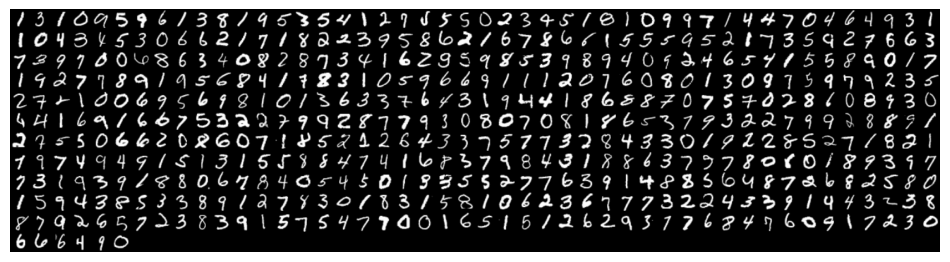

In [51]:
imgs, labels = next(iter(loader))  # [B, C, H, W], [B]

print(f'labels: {labels}')
imshow(imgs, nrow=11)

Инициализируем оптимизатор Adam и gradient scaler для обучения в fp16:

In [52]:
optimizer = torch.optim.Adam(fm.parameters(), lr=LR)
scaler = torch.amp.GradScaler()
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=N_EPOCHS,
    eta_min=5e-6
)

Поехали!

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

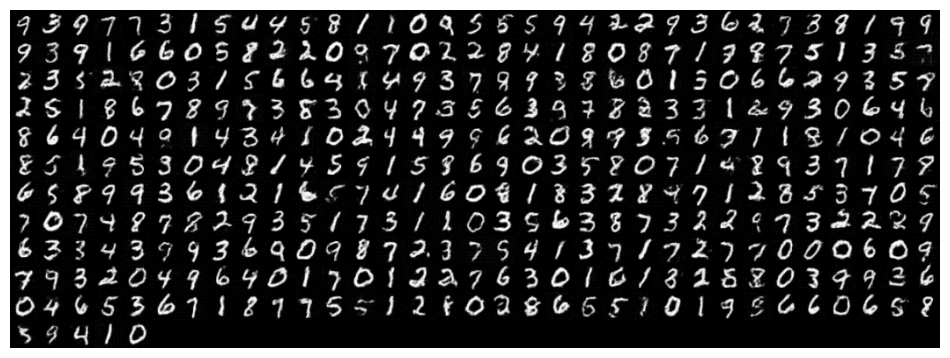

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

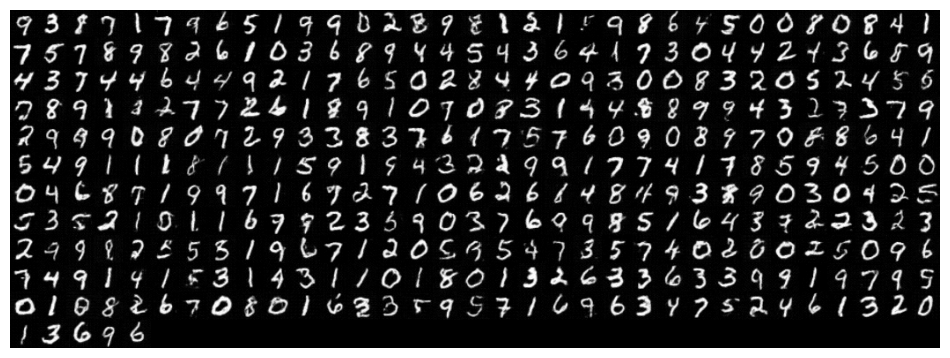

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

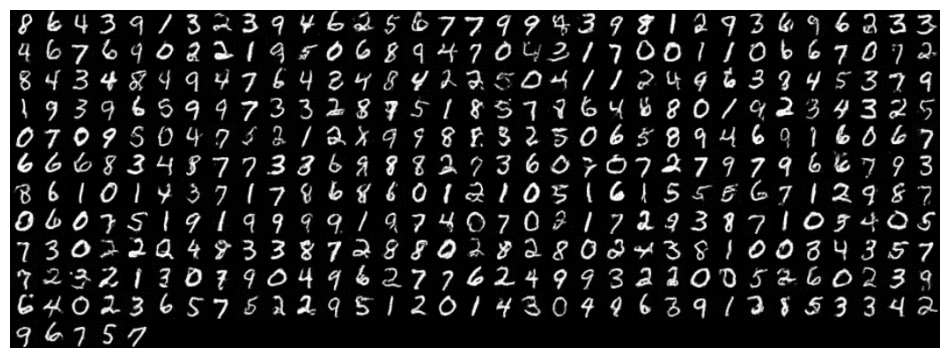

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

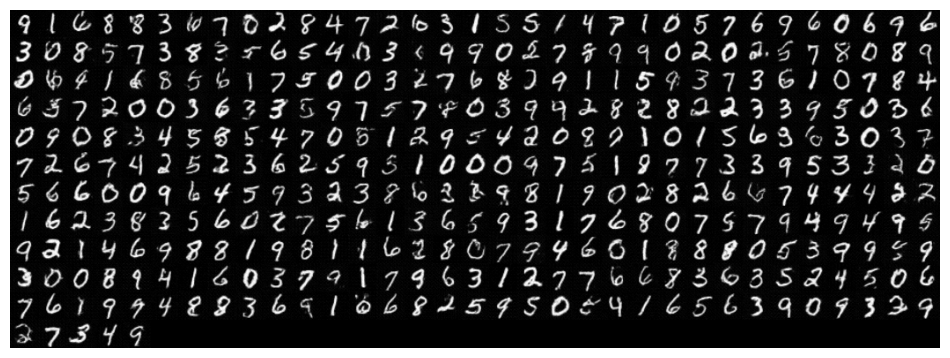

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

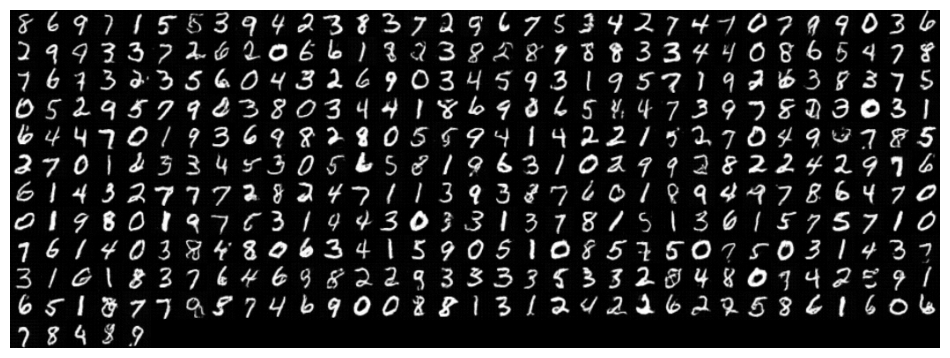

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

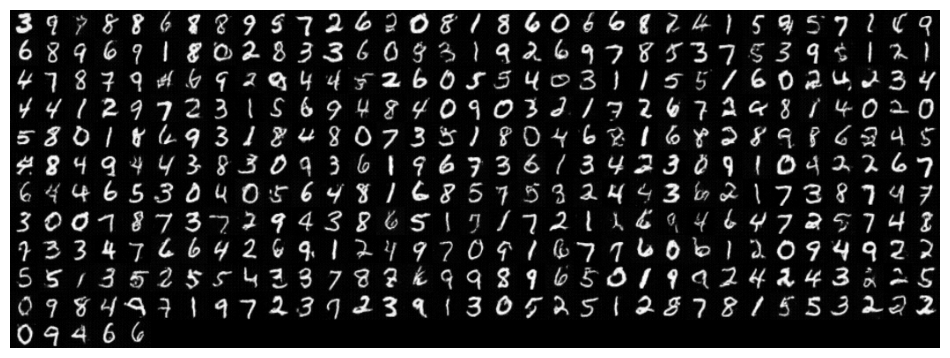

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

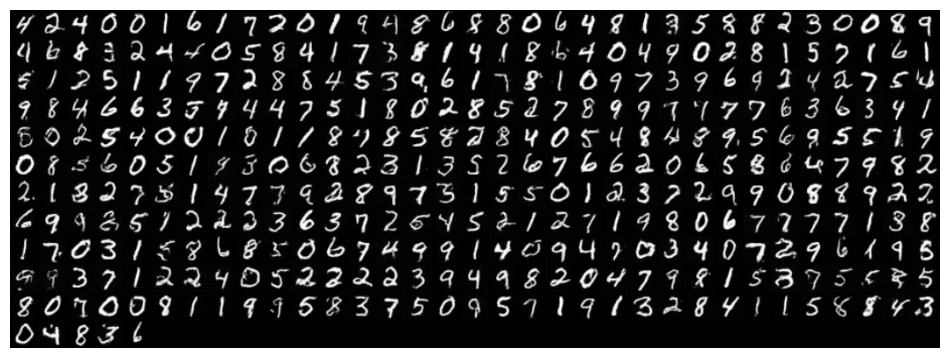

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

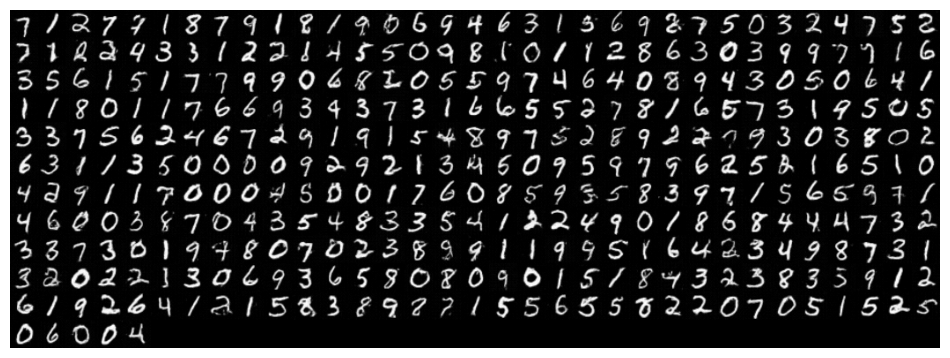

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

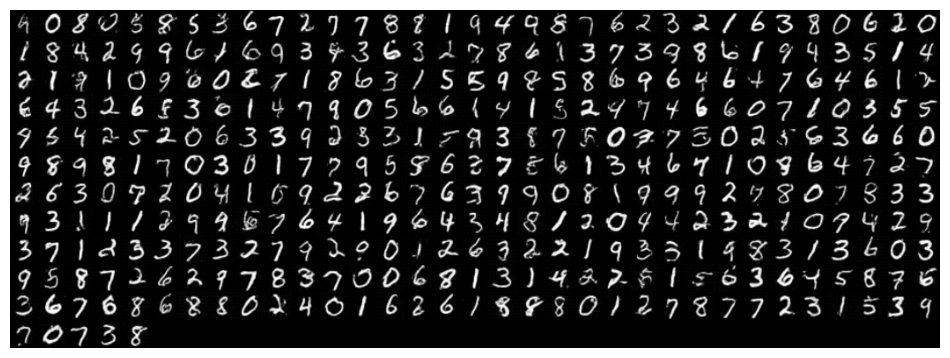

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

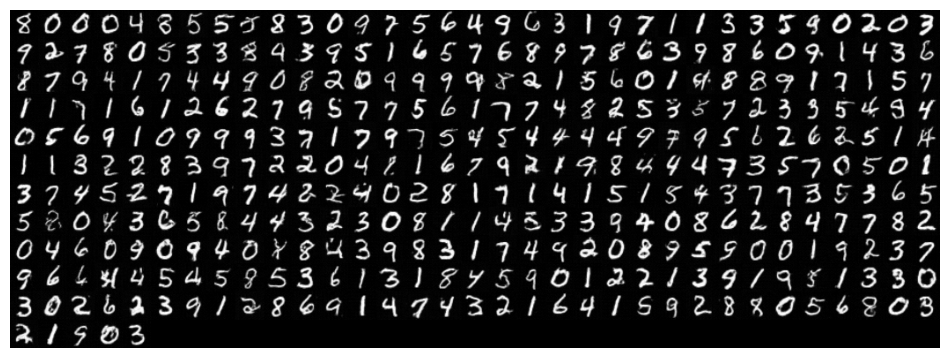

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

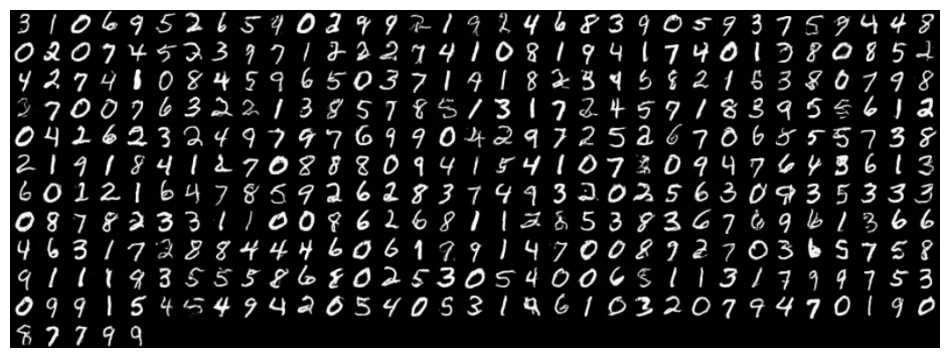

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

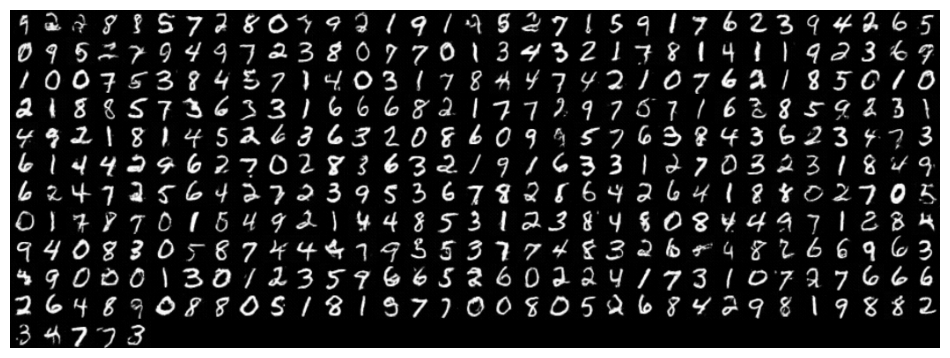

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

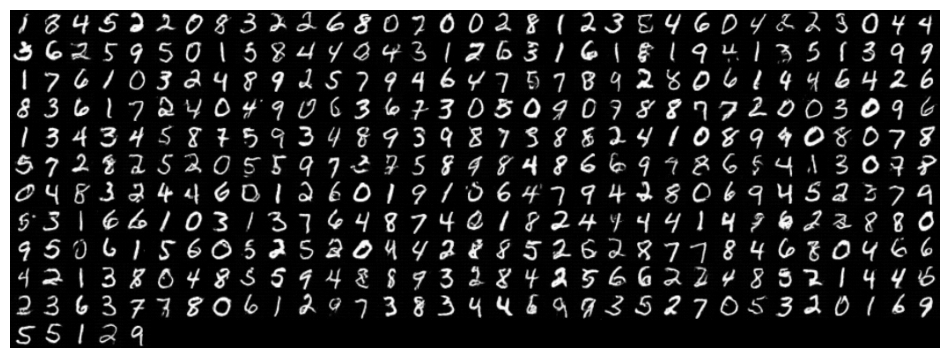

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

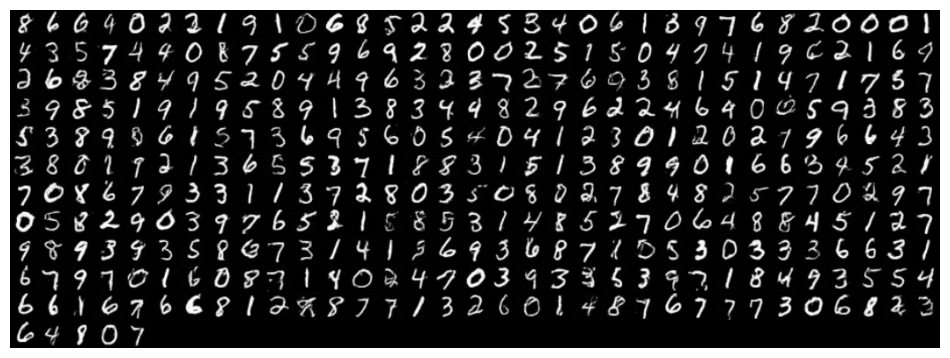

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

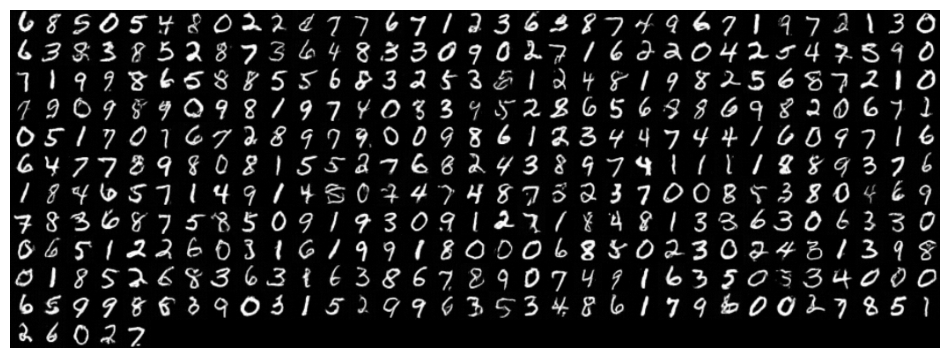

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

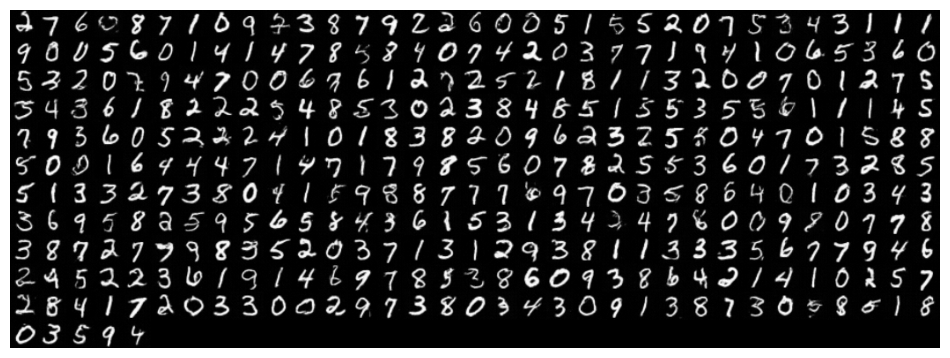

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

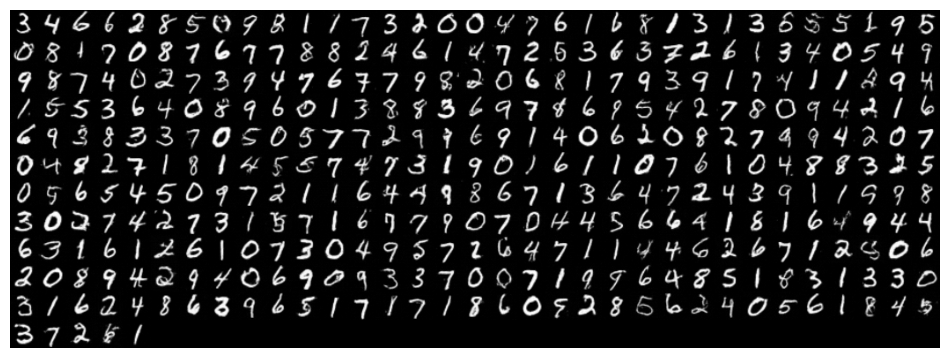

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

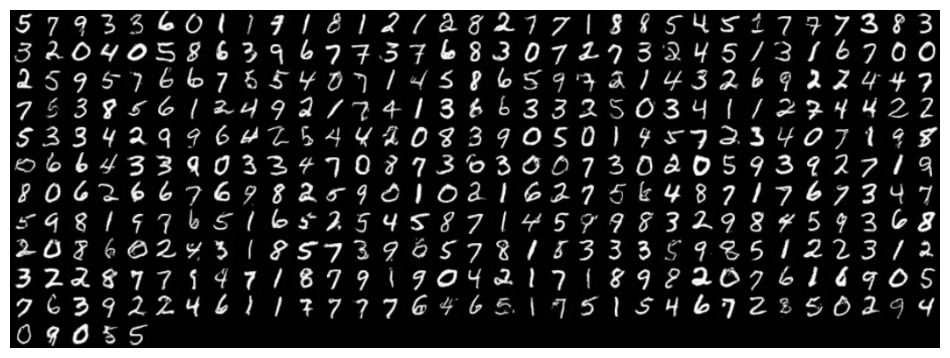

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

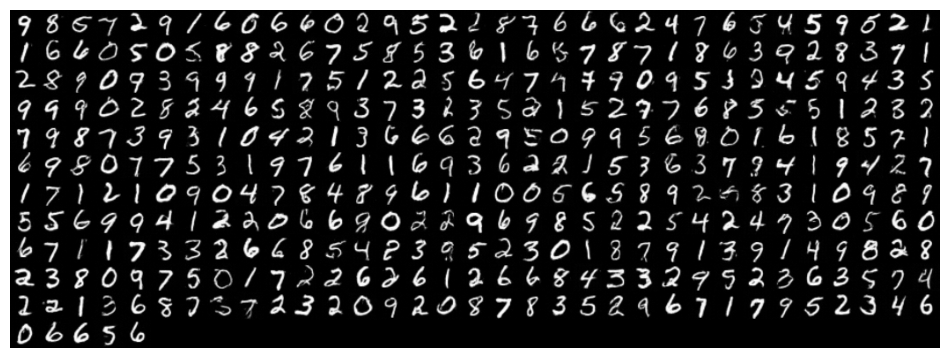

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

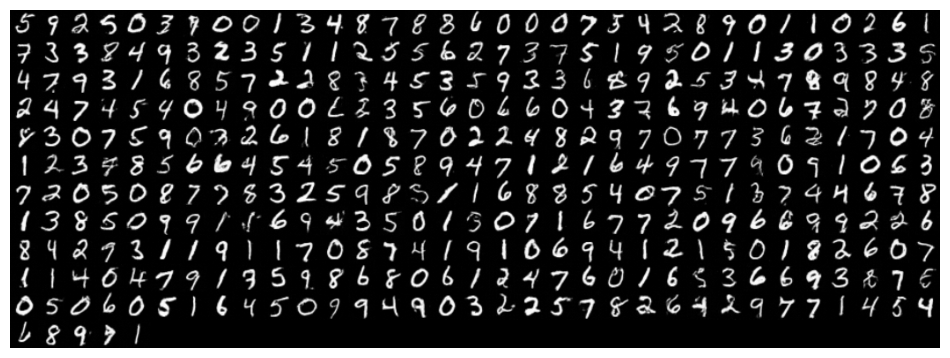

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

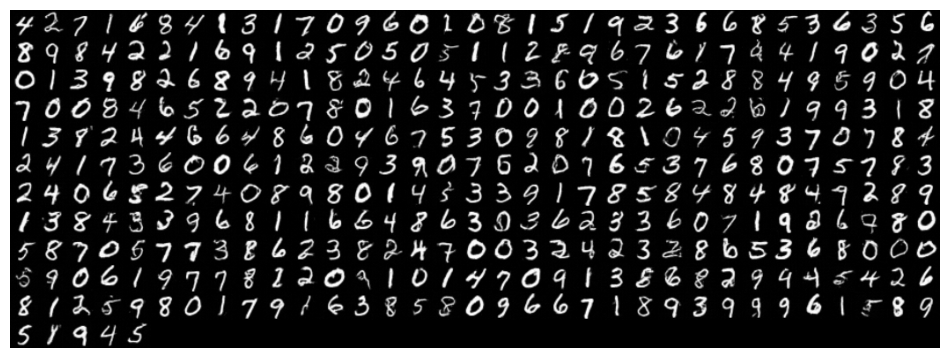

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

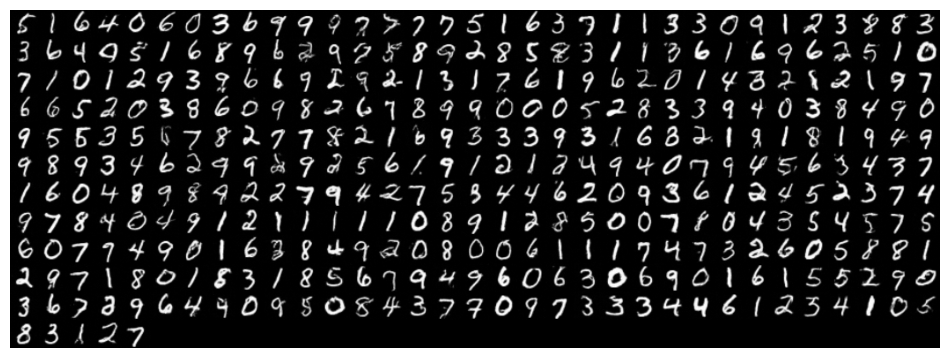

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

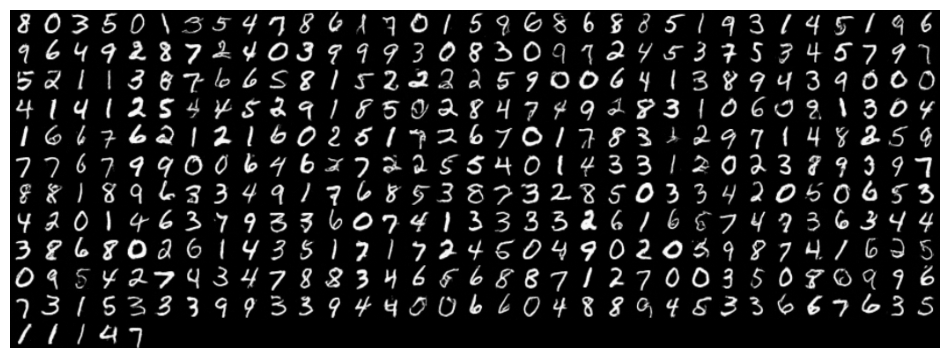

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

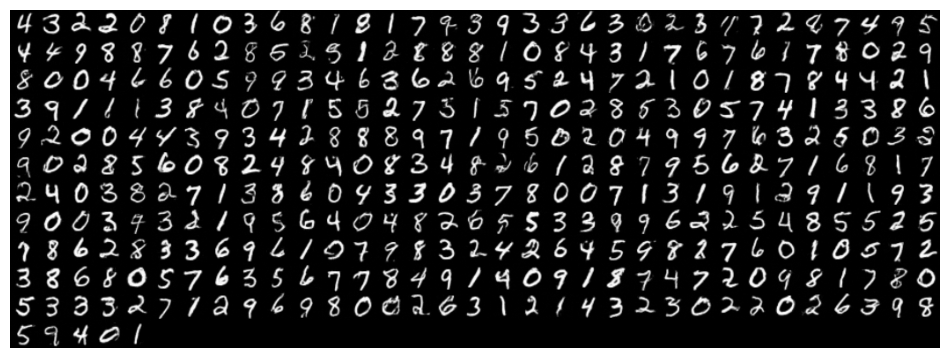

epoch 0/25, iteration 0, loss X:   0%|          | 0/137 [00:00<?, ?it/s]

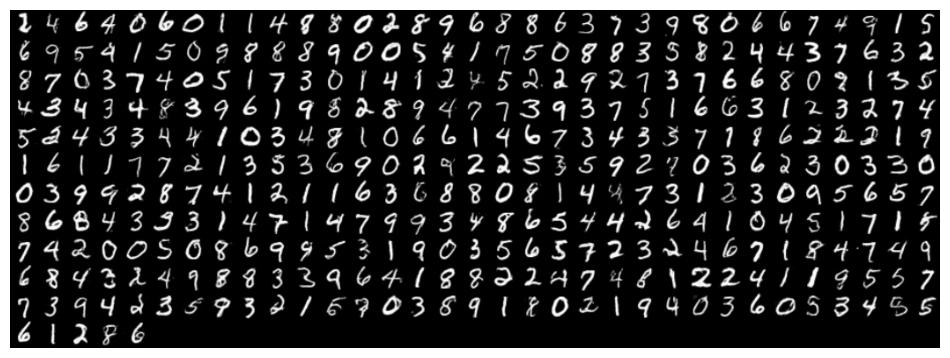

In [53]:
iteration = 0
for epoch in range(1, N_EPOCHS+1):
    with tqdm(loader, desc=f'epoch 0/{N_EPOCHS}, iteration 0, loss X') as progress_bar:
        for imgs, labels in progress_bar:
            fm.train()

            # переносим картинки и их лейблы на нужный девайс
            imgs = imgs.to(DEVICE)
            labels = labels.to(DEVICE)

            # здесь нужно занулить градиенты
            optimizer.zero_grad()

            # вызов функции для подсчета лосса
            with torch.amp.autocast(str(DEVICE), dtype=DTYPE):
                loss = fm(imgs, labels)

            scaler.scale(loss).backward()

            # обновляем веса
            scaler.step(optimizer)
            scaler.update()

            # логгируем лосс
            msg = f'epoch {epoch}/{N_EPOCHS}, iteration {iteration}, loss {loss.item()}'
            progress_bar.set_description(msg)

            iteration += 1

        scheduler.step()
        # в конце каждой эпохи мы смотрим как модель научилась генерировать картинки
        fm.eval()
        with torch.amp.autocast(str(DEVICE), dtype=DTYPE):
            test_labels = torch.LongTensor([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]).to(DEVICE)

            imgs_generated = fm.sample(labels, timesteps=4)
            imshow(imgs_generated, nrow=11)
        fm.train()

Сохраняем обученную модель, ее нужно будет приложить вместе с финальной версией тетрадки в Google Drive:

In [54]:
torch.save(fm.state_dict(), './MIKE_PANASIUK.pt')

Чекпоинт можно скачать слева из файлового менеджера.

___

## 4 Тестируем генерацию

Проверим, что обученный чекпоинт загружается:

In [55]:
dit_test = DiT(
    shape=(1, 32, 32),     # размеры наших картинок из MNIST
    patch_size=(4, 4),     # размер патча
    dim=512,               # размер эмбеддингов
    n_layers=10,            # кол-во слоев трансформера
    n_heads=8,             # кол-во голов в self-attention
    dim_mult=4.0,          # размер скрытого представления в FFN (во сколько раз разжимаем эмбеддинги)
    n_classes=10           # кол-во классов в MNIST (нужно для conditional генерации)
)
fm_test = FlowMatching(dit_test).to(DEVICE)

state_dict = torch.load('MIKE_PANASIUK.pt', weights_only=True)
fm_test.load_state_dict(state_dict)

<All keys matched successfully>

Запустим генерацию. Качество может варьироваться и может быть лучше/хуже в зависимости от кол-ва обучающих шагов. В нашем случае, важнее всего было познакомиться с методом и научиться его имплементировать. При желании, можете попробовать довести качество до идеального. С параметрами, выставленными в данной тетрадке, должно получиться что-то вроде такого:

<center><img src="https://i.postimg.cc/jqW1bB4x/image.png" style="width: 30%"></center>

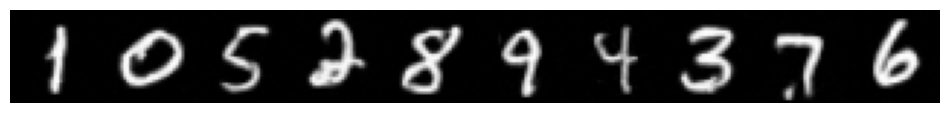

In [56]:
labels = torch.LongTensor([1, 0, 5, 2, 8, 9, 4, 3, 7, 6]).to(DEVICE)

with torch.amp.autocast(str(DEVICE), dtype=DTYPE):
    imgs_generated = fm_test.sample(labels, timesteps=4)
    imshow(imgs_generated, nrow=1)

Заметьте, для генерации хватает даже 4 итераций!